# Où Séjourneront Ils à Paris?

France, with its rich history and culture, is the most visited country in the world. Its capital, Paris, attracts more than 30 million visitors annually and there are more than 60,000 listings on Airbnb alone (on top of other hosting sites and hotels) to cater to the crowd.

It's a stiff competition out there and we have embarked on this project to create a guide for both Airbnb hosts' and potential visitors' reference - to help the former better position themselves more advantageously with competitive pricing and offerings and to aid the latter in making a more informed decision when it comes to booking their next accommodation for travel.

To do this, we will be using the dataset for listings in Paris from insideairbnb.com, last compiled in September 2022.

### Data Wrangling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
sns.set(rc={'figure.figsize':(11.7,8.27)})

In [2]:
df = pd.read_csv("/Users/jojotan/Documents/Portfolio/Airbnb_Paris/listings-detailed.csv")
df.head()
#Original CSV has been added with total number of amenities done using text-to-column and then counta and
#filled superhost status with 'f' for those left blank

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,130420.0,https://www.airbnb.com/rooms/130420,2.020000e+13,10/9/22,city scrape,Charming Apartment 2BR in Paris 9e,This quiet and bright flat is situated on the ...,The neighborhood of rue des Martyrs captures t...,https://a0.muscache.com/pictures/947410/5cb34c...,641777,...,4.96,4.81,4.43,7.51E+12,f,1,1,0,0,1.38
1,23441.0,https://www.airbnb.com/rooms/23441,2.020000e+13,10/9/22,city scrape,Charming at Montmartre & rue Lepic- mobility l...,This small charming apartment situated in the ...,NaN,https://a0.muscache.com/pictures/501057/ef0d26...,91706,...,4.96,4.63,4.64,"Available with a mobility lease only (""bail mo...",f,1,1,0,0,0.55
2,5396.0,https://www.airbnb.com/rooms/5396,2.020000e+13,10/9/22,city scrape,Explore the heart of old Paris,"Cozy, well-appointed and graciously designed s...","You are within walking distance to the Louvre,...",https://a0.muscache.com/pictures/52413/f9bf76f...,7903,...,4.82,4.95,4.54,7.51E+12,f,1,1,0,0,1.92
3,132994.0,https://www.airbnb.com/rooms/132994,2.020000e+13,10/9/22,previous scrape,charmant studio dans le marais,<b>The space</b><br />The apartment is small b...,NaN,https://a0.muscache.com/pictures/963469/69759a...,653074,...,4.59,4.91,4.50,NaN,f,1,1,0,0,0.26
4,7397.0,https://www.airbnb.com/rooms/7397,2.020000e+13,10/9/22,city scrape,MARAIS - 2ROOMS APT - 2/4 PEOPLE,"VERY CONVENIENT, WITH THE BEST LOCATION !<br /...",NaN,https://a0.muscache.com/pictures/67928287/330b...,2626,...,4.87,4.93,4.72,7.51E+12,f,2,2,0,0,2.25


In [3]:
df.shape

(61365, 76)

In [4]:
print(df.columns.tolist())

['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'total_amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availabil

In [5]:
#Removing columns that we don't need
df = df.drop(['listing_url', 
              'scrape_id', 
              'last_scraped',
              'source',
              'description', 
              'neighborhood_overview',
              'picture_url', 
              'host_url', 
              'host_location', 
              'host_about', 
              'host_thumbnail_url', 
              'host_picture_url', 
              'host_neighbourhood',
              'host_listings_count',
              'host_verifications',
              'host_response_rate',
              'host_acceptance_rate',
              'bathrooms_text', 
              'bedrooms', 
              'beds',
              'neighbourhood', 
              'neighbourhood_group_cleansed',
              'bathrooms',
              'maximum_nights',
              'minimum_minimum_nights', 
              'maximum_minimum_nights', 
              'minimum_maximum_nights', 
              'maximum_maximum_nights', 
              'minimum_nights_avg_ntm', 
              'maximum_nights_avg_ntm', 
              'calendar_updated',
              'calendar_last_scraped',
              'number_of_reviews_ltm', 
              'number_of_reviews_l30d', 
              'first_review', 
              'review_scores_accuracy', 
              'review_scores_cleanliness', 
              'review_scores_checkin', 
              'review_scores_communication', 
              'review_scores_location', 
              'review_scores_value',
              'license', 
              'instant_bookable', 
              'calculated_host_listings_count', 
              'calculated_host_listings_count_entire_homes', 
              'calculated_host_listings_count_private_rooms', 
              'calculated_host_listings_count_shared_rooms',], axis=1)

Since we are looking only at potential visitors, we will be limiting the dataset to only short-term rentals i.e. not more than 30 nights.

In [6]:
#filtering off listings with minimum nights more than 30 since we're looking at short-term rentals
df = df[df['minimum_nights'] <= 30]
df.head()

,id,name,host_id,host_name,host_since,host_response_time,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,...,minimum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review,review_scores_rating,reviews_per_month
0,130420.0,Charming Apartment 2BR in Paris 9e,641777,Yassine,30/5/11,within a few hours,t,1.0,t,t,...,1,t,4,26,38,301,188,6/9/22,4.60,1.38
1,23441.0,Charming at Montmartre & rue Lepic- mobility l...,91706,Elise,12/3/10,within a day,t,3.0,t,t,...,30,t,0,0,0,115,84,31/8/22,4.72,0.55
2,5396.0,Explore the heart of old Paris,7903,Borzou,14/2/09,within an hour,f,1.0,t,t,...,1,t,4,20,50,50,309,19/8/22,4.53,1.92
4,7397.0,MARAIS - 2ROOMS APT - 2/4 PEOPLE,2626,Franck,30/8/08,within an hour,t,8.0,t,t,...,10,t,0,13,22,207,313,8/9/22,4.71,2.25
5,24260.0,Lovely place near Champs Elysees,98012,Emmanuel,23/3/10,within a few hours,f,2.0,t,t,...,30,t,2,14,44,319,30,11/8/17,4.48,0.20


In [7]:
df.shape

(47471, 29)

### Finding Max, Min, Mean Prices & Outliers

#### Entire Home/ Apt

In [8]:
room_type1 = ['Entire home/apt']    
entire_home_df = df.loc[df['room_type'].isin(room_type1)]
entire_home_df.shape

(37990, 29)

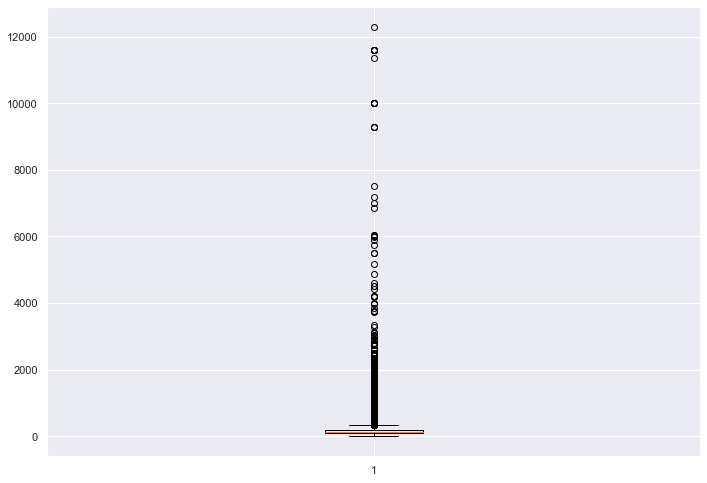

Max Price Per Night: 12286
Min Price Per Night: 10
Median Price Per Night 120.0
Average Price Per Night 181.74682811266123


In [9]:
plt.boxplot(entire_home_df["price"])
plt.show()
print("Max Price Per Night:", entire_home_df.price.max())
print("Min Price Per Night:", entire_home_df.price.min())
print("Median Price Per Night", entire_home_df.price.median())
print("Average Price Per Night", entire_home_df.price.mean())

In [10]:
sorted(entire_home_df)
entire_q1, entire_q3 = np.percentile(entire_home_df[['price']],[25,75])
print('25th Percentile =', entire_q1)
print('75th Percentile =', entire_q3)
IQR = entire_q3 - entire_q1
print('IQR =', entire_q3 - entire_q1)
entire_lower_bound = entire_q1 -(1.5 * IQR) 
entire_upper_bound = entire_q3 +(1.5 * IQR)
print('Lower Bound =', entire_lower_bound)
print('Upper Bound =', entire_upper_bound)

25th Percentile = 83.0
75th Percentile = 190.0
IQR = 107.0
Lower Bound = -77.5
Upper Bound = 350.5


In [11]:
#Finding and replacing outliers
for x in ['price']:
    q75,q25 = np.percentile(entire_home_df.loc[:,x],[75,25])
    intr_qr = q75-q25
 
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
 
    entire_home_df.loc[entire_home_df[x] < min,x] = np.nan
    entire_home_df.loc[entire_home_df[x] > max,x] = np.nan

/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [12]:
#Removing outliers which had been replaced with NaN
entire_home_df = entire_home_df.dropna(subset=['price'])
entire_home_df.shape

(34841, 29)

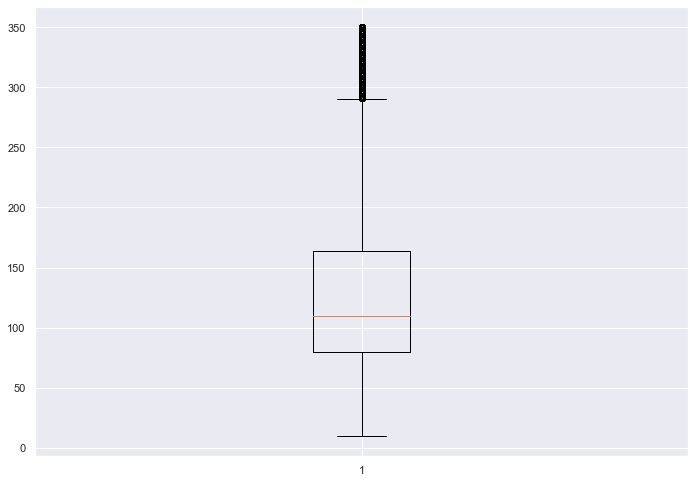

Max Price Per Night: 350.0
Min Price Per Night: 10.0
Median Price Per Night 110.0
Average Price Per Night 130.68976206193852


In [13]:
plt.boxplot(entire_home_df["price"])
plt.show()
print("Max Price Per Night:", entire_home_df.price.max())
print("Min Price Per Night:", entire_home_df.price.min())
print("Median Price Per Night", entire_home_df.price.median())
print("Average Price Per Night", entire_home_df.price.mean())

#### Private Room

In [14]:
room_type2 = ['Private room']
private_room_df = df.loc[df['room_type'].isin(room_type2)]
private_room_df.shape

(8140, 29)

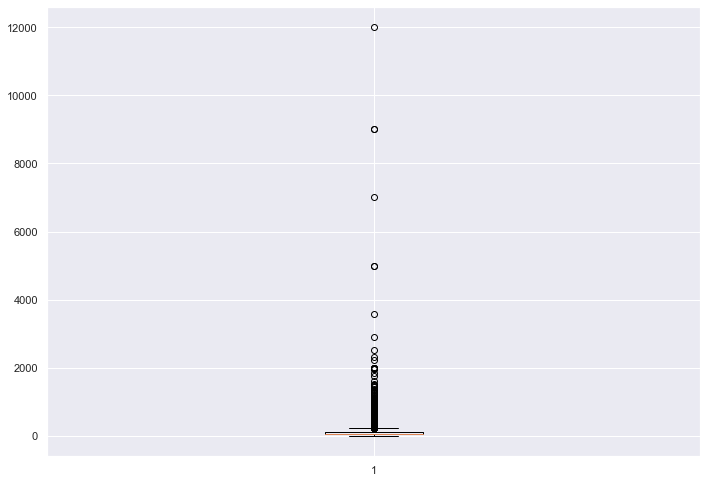

Max Price Per Night: 12000
Min Price Per Night: 1
Median Price Per Night 65.0
Average Price Per Night 134.53181818181818


In [15]:
plt.boxplot(private_room_df["price"])
plt.show()
print("Max Price Per Night:", private_room_df.price.max())
print("Min Price Per Night:", private_room_df.price.min())
print("Median Price Per Night", private_room_df.price.median())
print("Average Price Per Night", private_room_df.price.mean())

In [16]:
sorted(private_room_df)
pvt_q1, pvt_q3 = np.percentile(private_room_df[['price']],[25,75])
print('25th Percentile =', pvt_q1)
print('75th Percentile =', pvt_q3)
IQR = pvt_q3 - pvt_q1
print('IQR =', pvt_q3 - pvt_q1)
pvt_lower_bound = pvt_q1 -(1.5 * IQR) 
pvt_upper_bound = pvt_q3 +(1.5 * IQR)
print('Lower Bound =', pvt_lower_bound)
print('Upper Bound =', pvt_upper_bound)

25th Percentile = 45.0
75th Percentile = 120.0
IQR = 75.0
Lower Bound = -67.5
Upper Bound = 232.5


In [17]:
#Finding and replacing outliers
for x in ['price']:
    q75,q25 = np.percentile(private_room_df.loc[:,x],[75,25])
    intr_qr = q75-q25
 
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
 
    private_room_df.loc[private_room_df[x] < min,x] = np.nan
    private_room_df.loc[private_room_df[x] > max,x] = np.nan

/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [18]:
#Removing outliers which had been replaced with NaN
private_room_df = private_room_df.dropna(subset=['price'])
private_room_df.shape

(6854, 29)

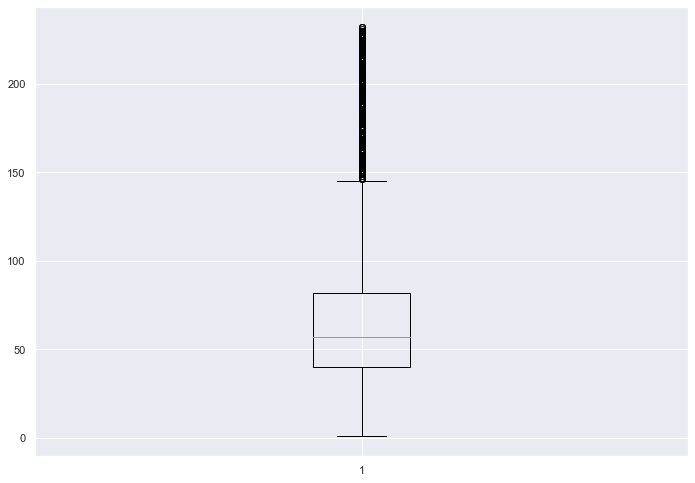

Max Price Per Night: 232.0
Min Price Per Night: 1.0
Median Price Per Night 57.0
Average Price Per Night 69.22206011088416


In [19]:
plt.boxplot(private_room_df["price"])
plt.show()
print("Max Price Per Night:", private_room_df.price.max())
print("Min Price Per Night:", private_room_df.price.min())
print("Median Price Per Night", private_room_df.price.median())
print("Average Price Per Night", private_room_df.price.mean())

#### Shared Room

In [20]:
room_type3 = ['Shared room']
shared_room_df = df.loc[df['room_type'].isin(room_type3)]
shared_room_df.shape

(369, 29)

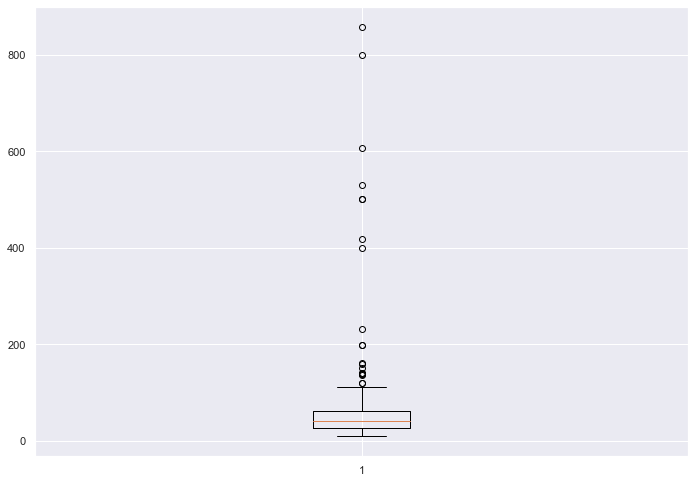

Max Price Per Night: 857
Min Price Per Night: 10
Median Price Per Night 40.0
Average Price Per Night 58.66124661246612


In [21]:
plt.boxplot(shared_room_df["price"])
plt.show()
print("Max Price Per Night:", shared_room_df.price.max())
print("Min Price Per Night:", shared_room_df.price.min())
print("Median Price Per Night", shared_room_df.price.median())
print("Average Price Per Night", shared_room_df.price.mean())

In [22]:
sorted(shared_room_df)
shrd_q1, shrd_q3 = np.percentile(shared_room_df[['price']],[25,75])
print('25th Percentile =',shrd_q1)
print('75th Percentile =', shrd_q3)
IQR = shrd_q3 - shrd_q1
print('IQR =', shrd_q3 - shrd_q1)
shrd_lower_bound = shrd_q1 -(1.5 * IQR) 
shrd_upper_bound = shrd_q3 +(1.5 * IQR)
print('Lower Bound =', shrd_lower_bound)
print('Upper Bound =', shrd_upper_bound)

25th Percentile = 27.0
75th Percentile = 62.0
IQR = 35.0
Lower Bound = -25.5
Upper Bound = 114.5


In [23]:
#Finding and replacing outliers
for x in ['price']:
    q75,q25 = np.percentile(shared_room_df.loc[:,x],[75,25])
    intr_qr = q75-q25
 
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
 
    shared_room_df.loc[shared_room_df[x] < min,x] = np.nan
    shared_room_df.loc[shared_room_df[x] > max,x] = np.nan

/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [24]:
#Removing outliers which had been replaced with NaN
shared_room_df = shared_room_df.dropna(subset=['price'])
shared_room_df.shape

(348, 29)

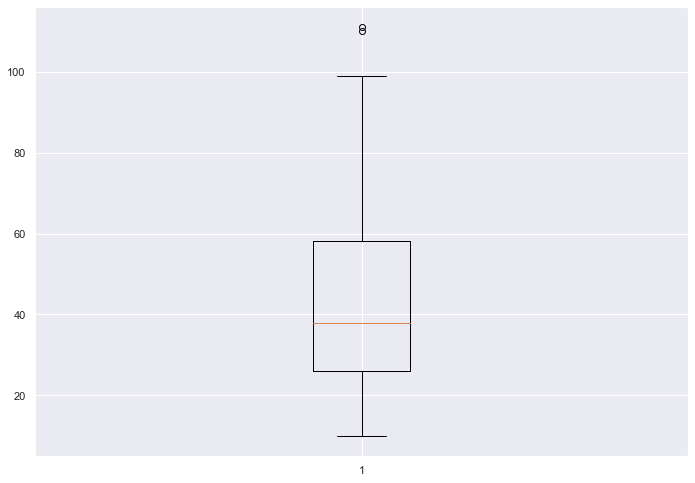

Max Price Per Night: 111.0
Min Price Per Night: 10.0
Median Price Per Night 38.0
Average Price Per Night 43.10919540229885


In [25]:
plt.boxplot(shared_room_df["price"])
plt.show()
print("Max Price Per Night:", shared_room_df.price.max())
print("Min Price Per Night:", shared_room_df.price.min())
print("Median Price Per Night", shared_room_df.price.median())
print("Average Price Per Night", shared_room_df.price.mean())

#### Hotel Room

In [26]:
room_type4 = ['Hotel room']
hotel_room_df = df.loc[df['room_type'].isin(room_type4)]
hotel_room_df.shape

(972, 29)

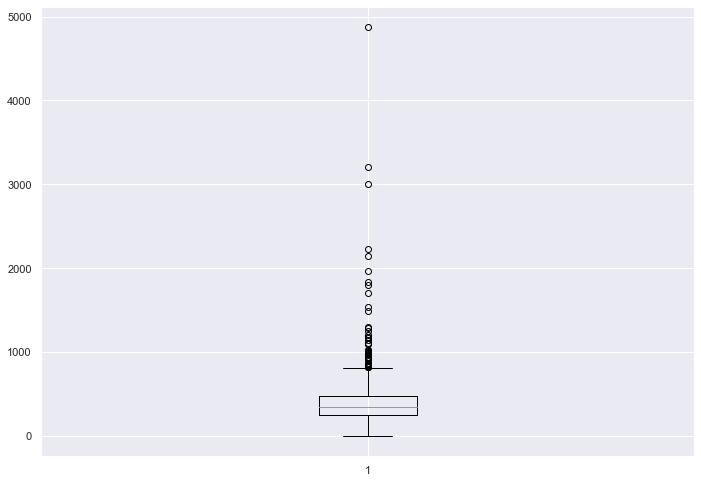

Max Price Per Night: 4873
Min Price Per Night: 0
Median Price Per Night 345.0
Average Price Per Night 399.537037037037


In [27]:
plt.boxplot(hotel_room_df["price"])
plt.show()
print("Max Price Per Night:", hotel_room_df.price.max())
print("Min Price Per Night:", hotel_room_df.price.min())
print("Median Price Per Night", hotel_room_df.price.median())
print("Average Price Per Night", hotel_room_df.price.mean())

In [28]:
sorted(hotel_room_df)
htl_q1, htl_q3 = np.percentile(hotel_room_df[['price']],[25,75])
print('25th Percentile =',htl_q1)
print('75th Percentile =', htl_q3)
IQR = htl_q3 - htl_q1
print('IQR =', htl_q3 - htl_q1)
htl_lower_bound = htl_q1 -(1.5 * IQR) 
htl_upper_bound = htl_q3 +(1.5 * IQR)
print('Lower Bound =', htl_lower_bound)
print('Upper Bound =', htl_upper_bound)

25th Percentile = 245.75
75th Percentile = 472.5
IQR = 226.75
Lower Bound = -94.375
Upper Bound = 812.625


In [29]:
#Finding and replacing outliers
for x in ['price']:
    q75,q25 = np.percentile(hotel_room_df.loc[:,x],[75,25])
    intr_qr = q75-q25
 
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
 
    hotel_room_df.loc[hotel_room_df[x] < min,x] = np.nan
    hotel_room_df.loc[hotel_room_df[x] > max,x] = np.nan

/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
/Users/jojotan/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [30]:
#Removing outliers which had been replaced with NaN
hotel_room_df = hotel_room_df.dropna(subset=['price'])
hotel_room_df.shape

(914, 29)

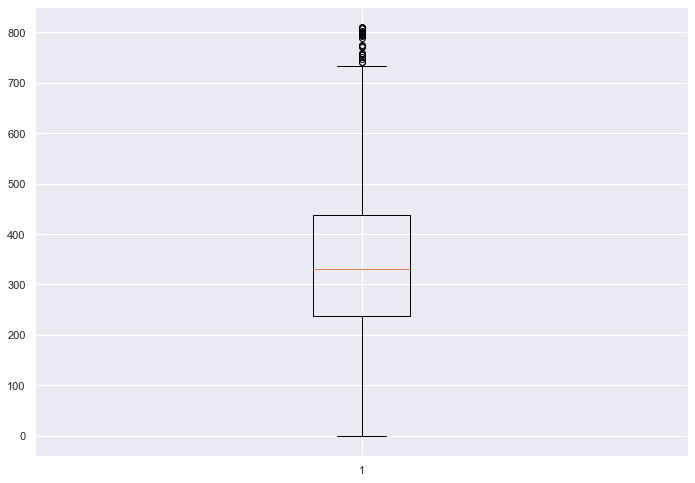

Max Price Per Night: 810.0
Min Price Per Night: 0.0
Median Price Per Night 331.5
Average Price Per Night 345.6345733041575


In [31]:
plt.boxplot(hotel_room_df["price"])
plt.show()
print("Max Price Per Night:", hotel_room_df.price.max())
print("Min Price Per Night:", hotel_room_df.price.min())
print("Median Price Per Night", hotel_room_df.price.median())
print("Average Price Per Night", hotel_room_df.price.mean())

In [32]:
df = entire_home_df.merge(private_room_df, how = 'outer')
df.shape

(41695, 29)

In [33]:
df = df.merge(shared_room_df, how = 'outer')
df.shape

(42043, 29)

In [34]:
df = df.merge(hotel_room_df, how = 'outer')
df.shape

(42957, 29)

### Room Type Distribution

In [35]:
room_type_counts = df["room_type"].value_counts()
room_type_counts

Entire home/apt    34841
Private room        6854
Hotel room           914
Shared room          348
Name: room_type, dtype: int64

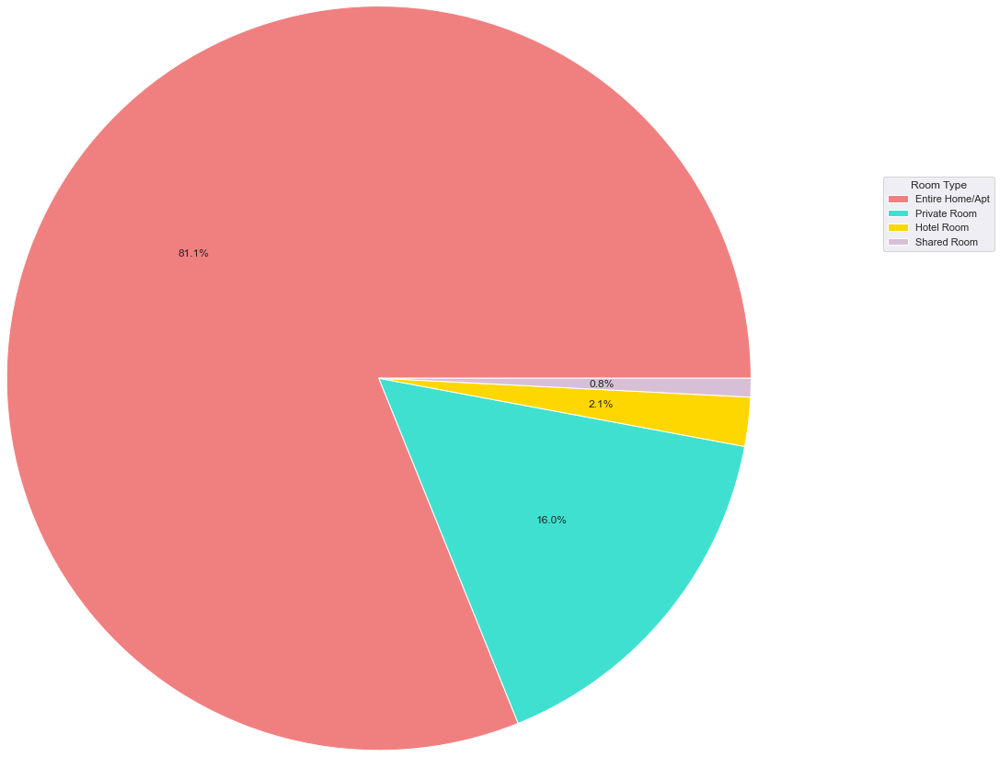

In [36]:
labels = 'Entire Home/Apt', 'Private Room', 'Hotel Room', 'Shared Room'
colors = 'lightcoral', 'turquoise', 'gold', 'thistle'
patches, texts, autotexts = plt.pie(room_type_counts, 
                                    colors = colors, 
                                    radius = 2.25, 
                                    autopct='%1.1f%%')
plt.legend(patches, labels, 
           title = "Room Type",
           loc = "best",
          bbox_to_anchor = (1, 0, 1, 1))
plt.show()

### Listing Distribution among Arrondissements

In [37]:
neighbourhood_counts = [df["neighbourhood_cleansed"].value_counts()]
neighbourhood_counts

[Buttes-Montmartre      4552
 Popincourt             3505
 Batignolles-Monceau    3185
 Vaugirard              3110
 Passy                  3053
 Buttes-Chaumont        2901
 Reuilly                2819
 Ménilmontant           2780
 Entrepôt               2719
 Observatoire           1944
 Gobelins               1867
 Opéra                  1685
 Temple                 1611
 Bourse                 1307
 Panthéon               1214
 Hôtel-de-Ville         1152
 Luxembourg              997
 Élysée                  899
 Palais-Bourbon          862
 Louvre                  795
 Name: neighbourhood_cleansed, dtype: int64]

In [38]:
neighbourhood_df = df.groupby(['neighbourhood_cleansed'], as_index = False).first()
neighbourhood_df = neighbourhood_df[['neighbourhood_cleansed', 'latitude', 'longitude']]
neighbourhood_df = neighbourhood_df.rename(columns={'latitude': 'nbh_lat', 'longitude': 'nbh_lon'})
nbh_counts = {'Buttes-Montmartre': 4564,
             'Popincourt': 3534,
             'Batignolles-Monceau': 3253,
             'Vaugirard': 3152,
             'Passy': 3059,
             'Buttes-Chaumont': 2914,
             'Entrepôt': 2759,
             'Ménilmontant': 2790,
             'Reuilly': 2845,
             'Observatoire': 1980,
             'Gobelins': 1877,
             'Opéra': 1734,
             'Temple': 1629,
             'Bourse': 1336,
             'Panthéon': 1227,
             'Hôtel-de-Ville': 1191,
             'Luxembourg': 1003,
             'Palais-Bourbon': 861,
             'Élysée': 877,
             'Louvre': 795}
neighbourhood_df['count'] = neighbourhood_df['neighbourhood_cleansed'].map(nbh_counts)
neighbourhood_df

,neighbourhood_cleansed,nbh_lat,nbh_lon,count
0,Batignolles-Monceau,48.88090,2.30388,3253
1,Bourse,48.86358,2.35057,1336
2,Buttes-Chaumont,48.87456,2.38532,2914
3,Buttes-Montmartre,48.88408,2.33478,4564
4,Entrepôt,48.87134,2.36968,2759
5,Gobelins,48.82460,2.36670,1877
6,Hôtel-de-Ville,48.85247,2.35835,1191
7,Louvre,48.86564,2.33184,795
8,Luxembourg,48.84555,2.32132,1003
9,Ménilmontant,48.85642,2.39748,2790


In [39]:
import textwrap
def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

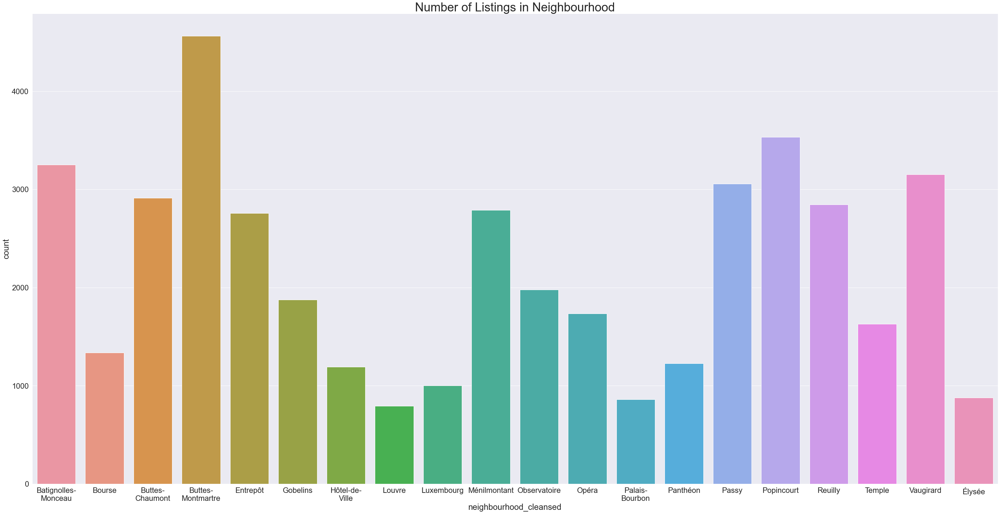

In [66]:
fig, ax = plt.subplots(figsize=(50, 25))
sns.set(font_scale=2)
sns.barplot(data = neighbourhood_df, 
            x = 'neighbourhood_cleansed', 
            y = 'count').set_title("Number of Listings in Neighbourhood", fontdict = {'size': 35})
wrap_labels(ax, 10)

The neighbourhood with the most number of listings is Buttes-Montmartre, followed by Popincourt.

In [41]:
paris_df = pd.merge(df, neighbourhood_df[['neighbourhood_cleansed','nbh_lat', 'nbh_lon']], 
                    on ='neighbourhood_cleansed', how ='left')
paris_df.tail()

,id,name,host_id,host_name,host_since,host_response_time,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,...,availability_30,availability_60,availability_90,availability_365,number_of_reviews,last_review,review_scores_rating,reviews_per_month,nbh_lat,nbh_lon
42952,31583764.0,Family apartment near Paris,235162681,Cécile Et Son Équipe,8/1/19,within an hour,t,7.0,t,t,...,18,48,78,323,12,29/8/22,4.75,0.29,48.88090,2.30388
42953,31583759.0,Single bed studio near Paris,235162681,Cécile Et Son Équipe,8/1/19,within an hour,t,7.0,t,t,...,13,40,70,315,28,25/8/22,4.86,0.70,48.88090,2.30388
42954,31372632.0,Hotel room 5 min from Paris Porte de Versailles,396754479,HappyCulture,13/4/21,NaN,f,192.0,t,f,...,6,23,40,310,118,21/8/22,4.77,2.69,48.85357,2.29232
42955,31583756.0,Superior Single bed studio near Paris,235162681,Cécile Et Son Équipe,8/1/19,within an hour,t,7.0,t,t,...,22,52,82,280,13,10/7/22,4.62,0.32,48.88090,2.30388
42956,32803735.0,Single room,396754479,HappyCulture,13/4/21,NaN,f,192.0,t,f,...,0,17,44,308,89,26/8/22,4.81,2.11,48.88090,2.30388


In [42]:
import folium
from folium.plugins import MarkerCluster
latitude = 48.864716
longitude = 2.349014
paris_map = folium.Map(location=[latitude, longitude], zoom_start=14)
marker_cluster = MarkerCluster()
for index, row in paris_df.iterrows():
  folium.Marker([row['nbh_lat'], row['nbh_lon']]).add_to(marker_cluster)
paris_map.add_child(marker_cluster)
paris_map

### Pricing among the Arrondissements

In [43]:
nbh_room_type_pivot = pd.pivot_table(paris_df,index=["room_type","neighbourhood_cleansed"],values=["price"],
               aggfunc={"price":[np.max,np.min,np.median,np.mean]},fill_value=0)
nbh_room_type_df= nbh_room_type_pivot.reset_index()
nbh_room_type_df

room_type neighbourhood_cleansed price                        
                                            amax amin        mean median
0   Entire home/apt    Batignolles-Monceau   350   19  122.140039  104.0
1   Entire home/apt                 Bourse   350   32  168.321859  154.5
2   Entire home/apt        Buttes-Chaumont   350   23  100.914311   89.0
3   Entire home/apt      Buttes-Montmartre   350   15  114.992151  100.0
4   Entire home/apt               Entrepôt   350   25  132.179614  119.0
..              ...                    ...   ...  ...         ...    ...
75      Shared room             Popincourt    73   15   44.857143   50.0
76      Shared room                Reuilly   110   21   48.555556   46.0
77      Shared room                 Temple    80   31   41.428571   32.0
78      Shared room              Vaugirard    71   17   37.818182   35.0
79      Shared room                 Élysée    80   28   56.000000   55.0

[80 rows x 6 columns]

In [44]:
nbh_room_type_df2 = nbh_room_type_df.droplevel(1, 1)
nbh_room_type_df2.columns = ['room_type', 'neighbourhood_cleansed', 'Max Price', 'Min Price', 'Median Price','Avg Price']
nbh_room_type_df2

,room_type,neighbourhood_cleansed,Max Price,Min Price,Median Price,Avg Price
0,Entire home/apt,Batignolles-Monceau,350,19,122.140039,104.0
1,Entire home/apt,Bourse,350,32,168.321859,154.5
2,Entire home/apt,Buttes-Chaumont,350,23,100.914311,89.0
3,Entire home/apt,Buttes-Montmartre,350,15,114.992151,100.0
4,Entire home/apt,Entrepôt,350,25,132.179614,119.0
...,...,...,...,...,...,...
75,Shared room,Popincourt,73,15,44.857143,50.0
76,Shared room,Reuilly,110,21,48.555556,46.0
77,Shared room,Temple,80,31,41.428571,32.0
78,Shared room,Vaugirard,71,17,37.818182,35.0


In [45]:
#To un-comment if needed to save dataframe again for reference
#nbh_room_type_df2.to_csv('/Users/jojotan/Documents/Portfolio/Airbnb_Paris/nbh_room_type.csv', index=False)

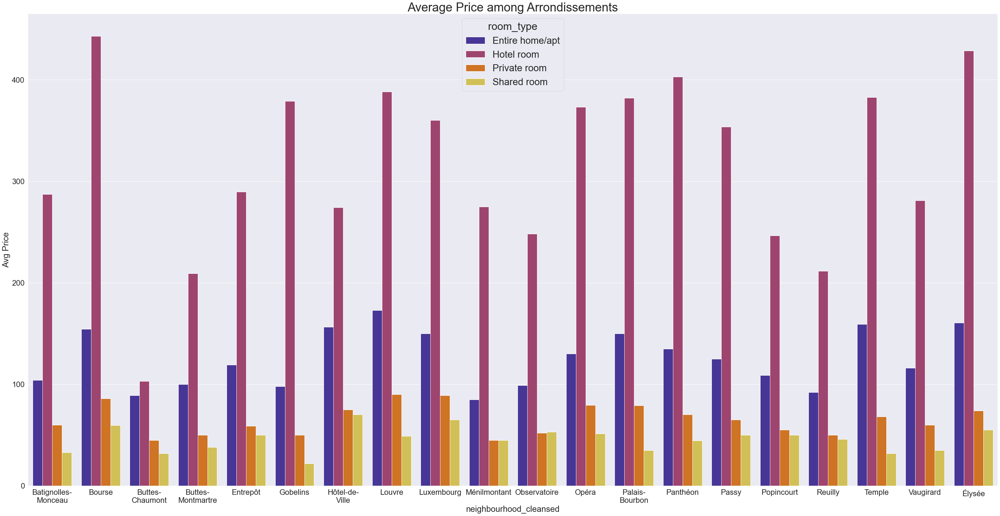

In [46]:
fig, ax = plt.subplots(figsize=(50, 25))
sns.set(font_scale=2.5)
sns.barplot(data = nbh_room_type_df2, 
            x = 'neighbourhood_cleansed', 
            y = 'Avg Price',
            hue = 'room_type',
            palette = sns.color_palette('CMRmap', n_colors = 4)).set_title("Average Price among Arrondissements", fontdict = {'size': 35})
wrap_labels(ax, 10)

Hotel rooms generally cost a lot more than the other room types, with the average price being the highest at Bourse (2nd arrondissement)and lowest at Buttes-Chaumont (19th). Pricing is at the highest for entire homes at Louvre (1st) and lowest at Ménilmontant (20th); highest at Louvre (1st) and lowest at Ménilmontant (20th) for private rooms; highest at Hôtel de Ville (4th) and lowest at Gobelins (13th) for shared rooms.

<b><u>Possible reasons for the pricing in the respective arrondissements (based on their vicinities):</u></b>

Louvre (1er) - The least populated of all arrondissements and as shown earlier with the least number of listings among all arrondissements which might've caused the average price to be higher. It is also where the Louvre Museum, the Tuileries Gardens and Westfield Forum des Halles (largest shopping mall in Paris) are located. With much of the remainder of the arrondissement dedicated to business and administration, we can also surmise that the higher pricing is to cater to tourists and business people alike.

Bourse (2ème) -  The smallest arrondissement in Paris which hosts an important business district, housing the city's most dense concentration of business activities with the former Paris Bourse (stock exchange) and several banking headquarters in the area. Its low residential population, central location in the city, together with its dense concentration of commercial activity (the densest in the capital, in fact) drives the high prices of the listings targeted at business travellers.

Hôtel de Ville (4ème) - The area spans over a small land area like the abovementioned two - third smallest in the city, in fact - and is located in the first sector of Paris. The neighbourhood has a generally small population and houses the city hall of Paris and the famed Notre-Dame. It is already regarded by locals to be expensive and congested, which is reflected in the listing prices over here as well. 

If we look at the prices between the three for entire homes, we can see that there isn't too big a difference and from that can surmise that the high pricing may be due to the scarcity of listings and centralised location.

In [47]:
first_sector = ['Louvre','Bourse','Temple', 'Hôtel-de-Ville']    
first_sector_df = nbh_room_type_df2.loc[nbh_room_type_df2['neighbourhood_cleansed'].isin(first_sector)]
first_sector_df

,room_type,neighbourhood_cleansed,Max Price,Min Price,Median Price,Avg Price
1,Entire home/apt,Bourse,350,32,168.321859,154.5
6,Entire home/apt,Hôtel-de-Ville,350,27,171.936759,156.5
7,Entire home/apt,Louvre,350,32,181.824885,173.0
17,Entire home/apt,Temple,350,30,169.810606,159.0
21,Hotel room,Bourse,663,0,403.240000,443.0
26,Hotel room,Hôtel-de-Ville,808,263,391.000000,274.0
27,Hotel room,Louvre,798,0,371.415094,388.0
37,Hotel room,Temple,694,189,403.909091,382.5
41,Private room,Bourse,232,20,93.562500,86.0
46,Private room,Hôtel-de-Ville,229,20,88.898438,75.0


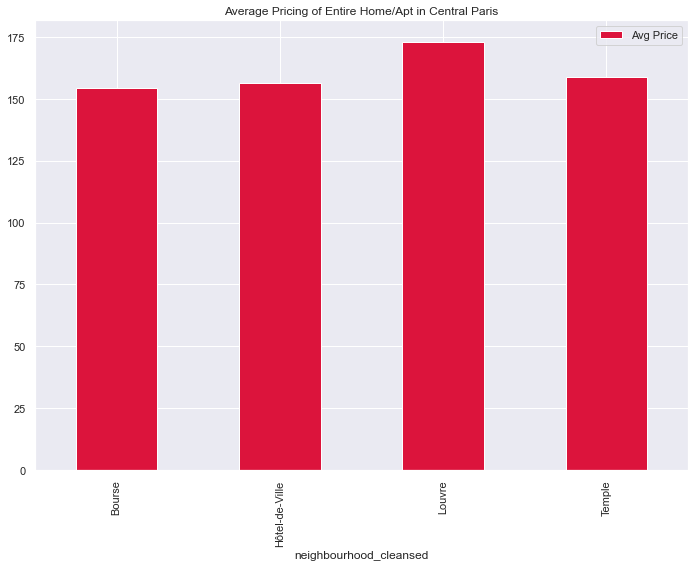

In [48]:
sns.set(font_scale=1)
first_sector_entire_house = first_sector_df[first_sector_df.room_type == 'Entire home/apt'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='Avg Price', 
    color = 'crimson',
    title='Average Pricing of Entire Home/Apt in Central Paris')

Gobelins (13ème) - A residential neighbourhood where Chinatown is located with a handful of senior high schools and engineering graduate schools and a high concentration of Chinese and Vietnamese businesses - all of which is not typical on a tourist's route in Paris. Lower prices in this case for private and shared rooms perhaps to cater more to locals and students than tourists.

Buttes-Chaumont (19ème) - A residential area without much tourist attractions. The neighbourhood, despite being large and varied, is also an underprivileged area with people living below the poverty line (source: <i>https://www.expatica.com/fr/moving/location/where-to-live-in-paris-103864/#residential-south</i>) thus resulting in a bad reputation, which we can largely attribute to the general low pricing across all room types as compared with the other arrondissements.

Ménilmontant (20ème) - The neighbourhood has a working-class history which could explain the lower pricing. Its hippy, bohemian identity may also only appeal to a selective group of audience. A non-touristy area which is located further away from central Paris and includes a 87m high hill which may pose as an inconvenience to some.

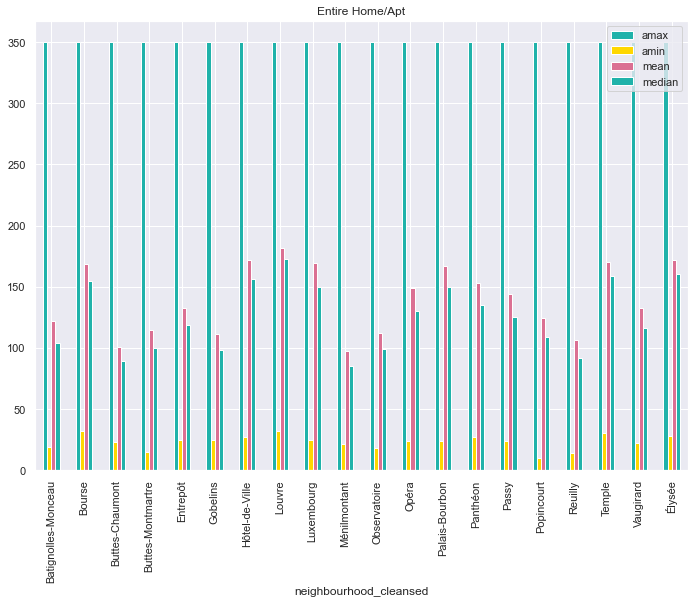

In [49]:
powpow = ['lightseagreen', 'gold', 'palevioletred']
sns.set(font_scale=1)
nbh_entire_house = nbh_room_type_df[nbh_room_type_df.room_type == 'Entire home/apt'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='price', 
    color = powpow,
    title='Entire Home/Apt')

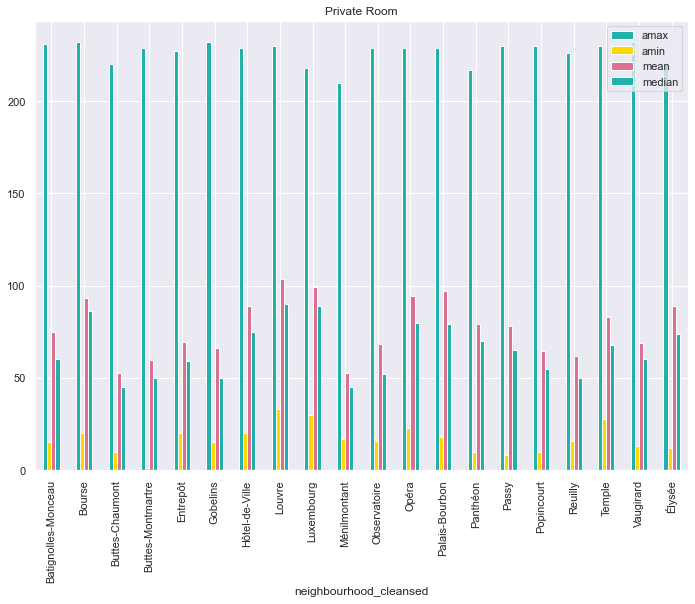

In [50]:
nbh_pvt_rm = nbh_room_type_df[nbh_room_type_df.room_type == 'Private room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='price', 
    color = powpow,
    title='Private Room')

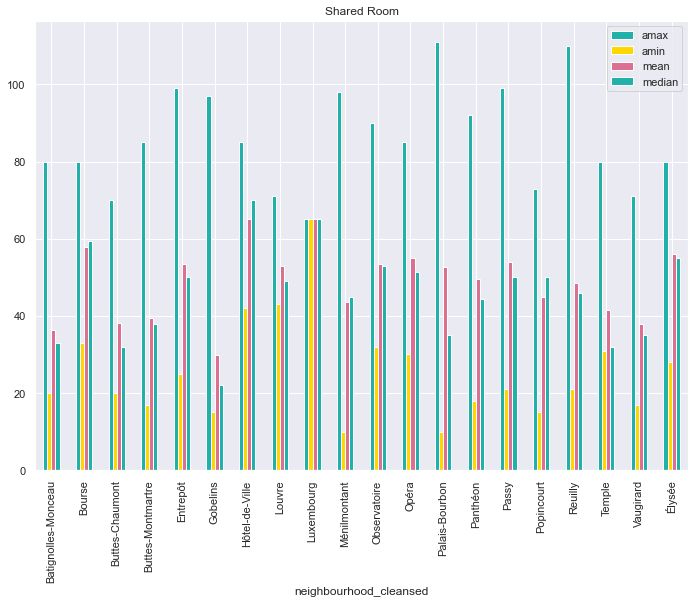

In [51]:
nbh_shrd_rm = nbh_room_type_df[nbh_room_type_df.room_type == 'Shared room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='price', 
    color = powpow,
    title='Shared Room')

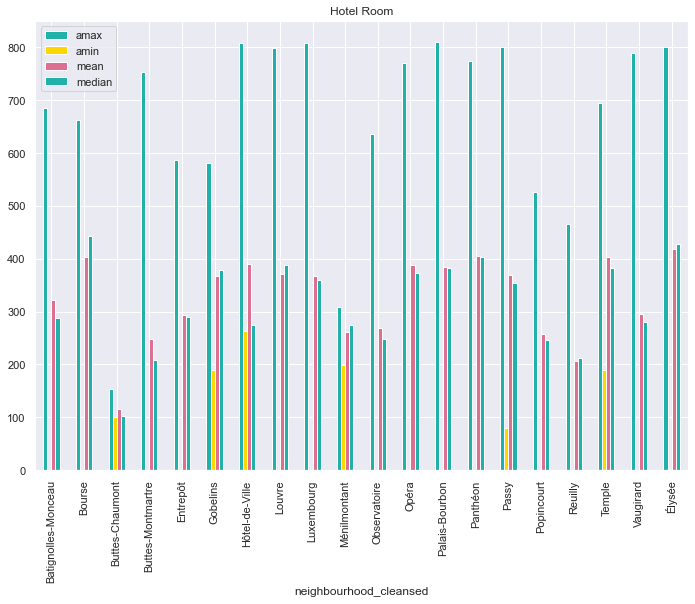

In [52]:
nbh_hotel_rm = nbh_room_type_df[nbh_room_type_df.room_type == 'Hotel room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='price', 
    color = powpow,
    title='Hotel Room')

### Listing Availability among the Arrondissements

In [53]:
room_type_availability_df = paris_df[['room_type', 'neighbourhood_cleansed', 'availability_365']]
room_type_availability_df = room_type_availability_df[
                            (room_type_availability_df['availability_365'] > 0) & 
                            (room_type_availability_df['availability_365'] < 365)]
room_type_availability_df

,room_type,neighbourhood_cleansed,availability_365
0,Entire home/apt,Opéra,301
1,Entire home/apt,Buttes-Montmartre,115
2,Entire home/apt,Hôtel-de-Ville,50
3,Entire home/apt,Hôtel-de-Ville,207
4,Entire home/apt,Batignolles-Monceau,319
...,...,...,...
42952,Hotel room,Batignolles-Monceau,323
42953,Hotel room,Batignolles-Monceau,315
42954,Hotel room,Vaugirard,310
42955,Hotel room,Batignolles-Monceau,280


In [54]:
room_type_availability_pivot = pd.pivot_table(room_type_availability_df,
                                              index=["room_type", "neighbourhood_cleansed"],
                                              values=["availability_365"],
               aggfunc={"availability_365":[np.mean]},fill_value=0)      
room_type_availability_df2 = room_type_availability_pivot.reset_index()
room_type_availability_df2 = room_type_availability_df2.droplevel(1, 1)
room_type_availability_df2

,room_type,neighbourhood_cleansed,availability_365
0,Entire home/apt,Batignolles-Monceau,171.072283
1,Entire home/apt,Bourse,187.029148
2,Entire home/apt,Buttes-Chaumont,143.102849
3,Entire home/apt,Buttes-Montmartre,143.841887
4,Entire home/apt,Entrepôt,143.846880
...,...,...,...
72,Shared room,Popincourt,286.625000
73,Shared room,Reuilly,239.764706
74,Shared room,Temple,252.600000
75,Shared room,Vaugirard,116.312500


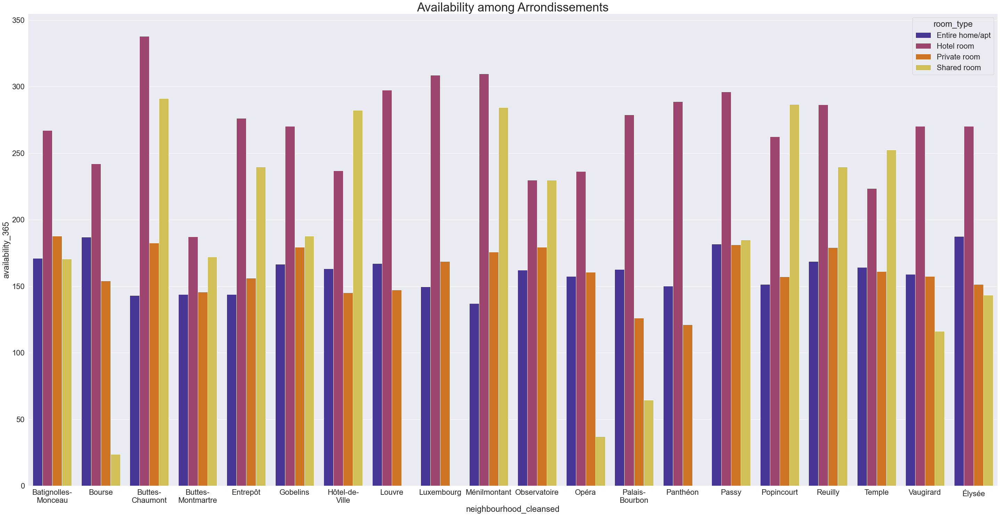

In [67]:
fig, ax = plt.subplots(figsize=(50, 25))
sns.set(font_scale=2)
sns.barplot(data = room_type_availability_df2, 
            x = 'neighbourhood_cleansed', 
            y = 'availability_365',
            hue = 'room_type',
            palette = sns.color_palette('CMRmap', n_colors = 4)).set_title("Availability among Arrondissements", fontdict = {'size': 35})
wrap_labels(ax, 10)

The average availability throughout the year is used here to look at the availability of the respective room types in the 20 arrondissements, with availability_365 filtered to be between 0 and 365 as realistically there would be at least a or two days available throughout the year and there should be at least a day booked throughout the year. This also helps to omit listings which hosts might have blocked out the entire calendar of or set prices way higher to prevent reservations (the latter resulting in high availability). Hence it is to be noted that arrondissements with missing room types in the chart do not equate to being the most popular area, but rather have been removed from the list.

Generally, the higher the availability, the fewer the bookings received. From this we can see which are the popular neighbourhoods amongst visitors for the different room types. However, it is to be noted that the low availability for shared rooms in certain arrondissements may be due to its low supply of listings in the area - highly plausible given that shared rooms contribute to only a 0.8% out of the total mix. Zero availability refers to no listing available for comparison.

We can see that the disparity between the various room types is the lowest in Buttes-Montmartre compared to the majority which reflects similar level of demand, hence the higher supply in listings which resulted in it having the most number of listings out of the 20 arrondissements. This could be due to affordability (the average prices in Buttes-Montmartre are generally mid-range) and its vicinity (Buttes-Montmartre is a historical place with a rich cafe culture and is where Sacré-Cœur and Moulin Rouge are located).

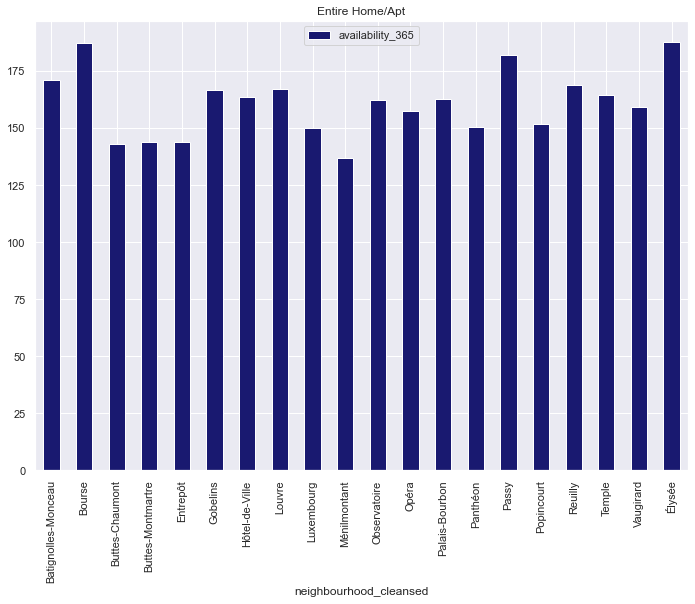

In [56]:
sns.set(font_scale=1)
entire_house_avail = room_type_availability_df2[room_type_availability_df2.room_type == 'Entire home/apt'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='availability_365',
    color = 'midnightblue',
    title='Entire Home/Apt')

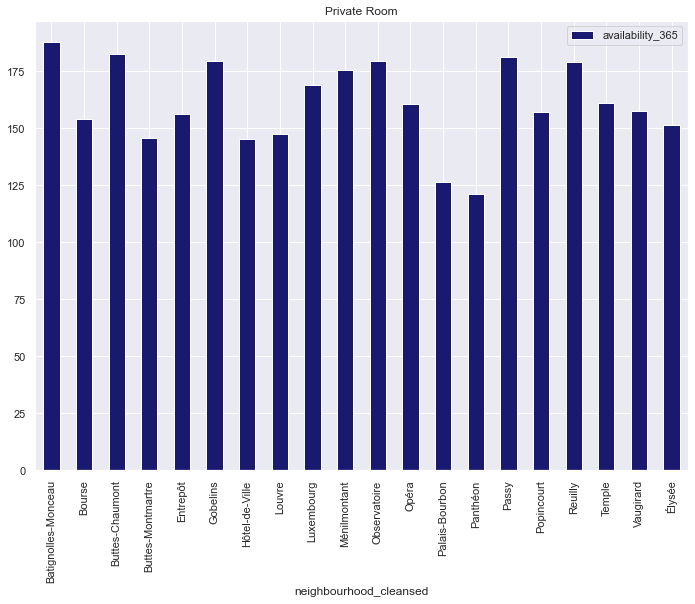

In [57]:
pvt_rm_avail = room_type_availability_df2[room_type_availability_df2.room_type == 'Private room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='availability_365',
    color = 'midnightblue',
    title='Private Room')

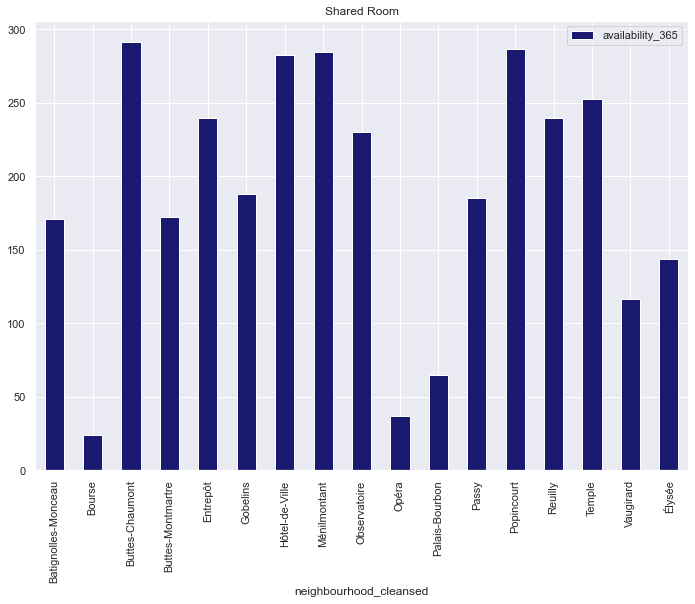

In [58]:
shrd_rm_avail = room_type_availability_df2[room_type_availability_df2.room_type == 'Shared room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='availability_365', 
    color = 'midnightblue',
    title='Shared Room')

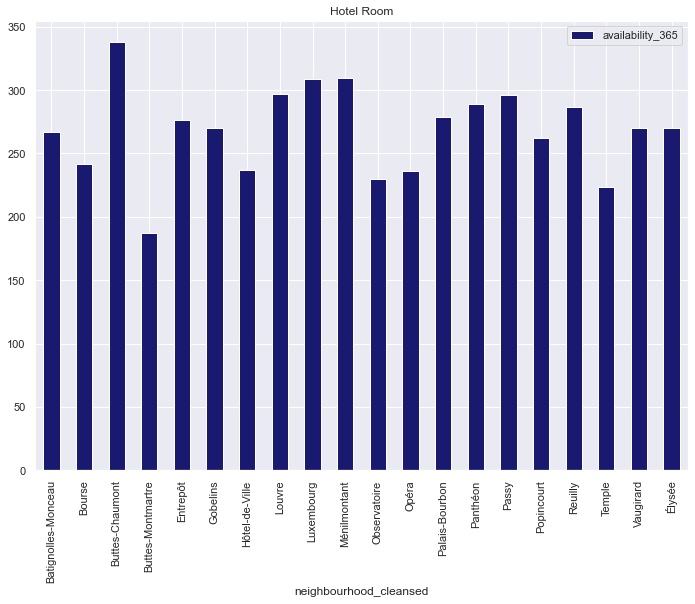

In [59]:
hotel_rm_avail = room_type_availability_df2[room_type_availability_df2.room_type == 'Hotel room'].plot(
    kind='bar', 
    x='neighbourhood_cleansed', 
    y='availability_365', 
    color = 'midnightblue',
    title='Hotel Room')

### Examining the Effects of Holding a Superhost Status

In [60]:
superhost_counts = [paris_df["host_is_superhost"].value_counts()]
superhost_counts

[f    36393
 t     6564
 Name: host_is_superhost, dtype: int64]

In [61]:
superhost_availability_pivot = pd.pivot_table(paris_df,index=["host_is_superhost"],
                                              values=["availability_30", 
                                                      "availability_60",
                                                      "availability_90",],
               aggfunc={"availability_30":[np.mean],
                        "availability_60":[np.mean],
                        "availability_90":[np.mean]},fill_value=0)
superhost_availability_pivot = superhost_availability_pivot.unstack()

In [62]:
superhost_availability_df = superhost_availability_pivot.reset_index()
superhost_availability_df = superhost_availability_df.drop(['level_1'], axis = 1)       
superhost_availability_df.rename(columns={"level_0": "Availability", 0: "Mean"}, inplace = True)
superhost_availability_df

,Availability,host_is_superhost,Mean
0,availability_30,f,3.032314
1,availability_30,t,2.516910
2,availability_60,f,9.575825
3,availability_60,t,8.518129
4,availability_90,f,18.676943
5,availability_90,t,18.443480


Text(0.5, 1.0, 'Listing Availability between Superhosts & Non-Superhosts')

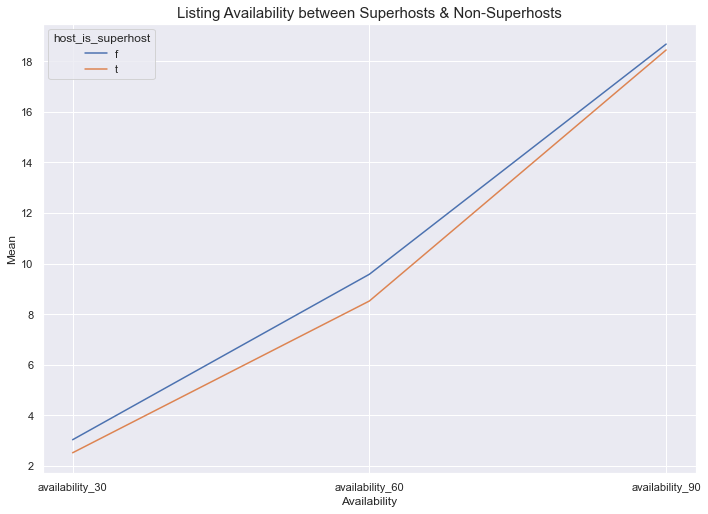

In [69]:
sns.set(font_scale=1)
sns.lineplot(data = superhost_availability_df, 
             x = "Availability", 
             y = "Mean", 
             hue = "host_is_superhost").set_title("Listing Availability between Superhosts & Non-Superhosts", fontdict = {'size': 15})

In [70]:
availability_365_pivot = pd.pivot_table(paris_df,index=["host_is_superhost"],
                                        values=["availability_365"],
                                        aggfunc={"availability_365":[np.mean]},
                                        fill_value=0)
availability_365_pivot

,availability_365
,mean
host_is_superhost,
f,108.431457
t,119.695917


The average is used here due to the large disparity between number of superhosts and non-superhosts. It is apparent that superhosts generally receive more bookings for their listings as the higher the number of days, the more available the listing is. Even though the non-superhosts' availability in a year seems to be lower than the superhosts', we can deem that as negligible given the the large difference in their numbers (number of non-superhosts is 5.5 times more than number of superhosts).

In [71]:
superhost_price_pivot = pd.pivot_table(paris_df,index=["room_type", "host_is_superhost"],values=["price"],
               aggfunc={"price":[np.max,np.min,np.mean]},fill_value=0)
superhost_price_df = superhost_price_pivot.reset_index()
superhost_price_df = superhost_price_df.droplevel(1, 1)
superhost_price_df.columns = ['room_type', 'host_is_superhost', 'Max Price', 'Min Price', 'Avg Price']
superhost_price_df

,room_type,host_is_superhost,Max Price,Min Price,Avg Price
0,Entire home/apt,f,350,10,128.987193
1,Entire home/apt,t,350,15,140.126948
2,Hotel room,f,810,0,338.234980
3,Hotel room,t,802,97,379.224242
4,Private room,f,232,1,67.606337
5,Private room,t,230,17,78.183381
6,Shared room,f,111,10,42.492212
7,Shared room,t,99,27,50.444444


Text(0.5, 1.0, 'Average Listing Prices between Superhosts & Non-Superhosts')

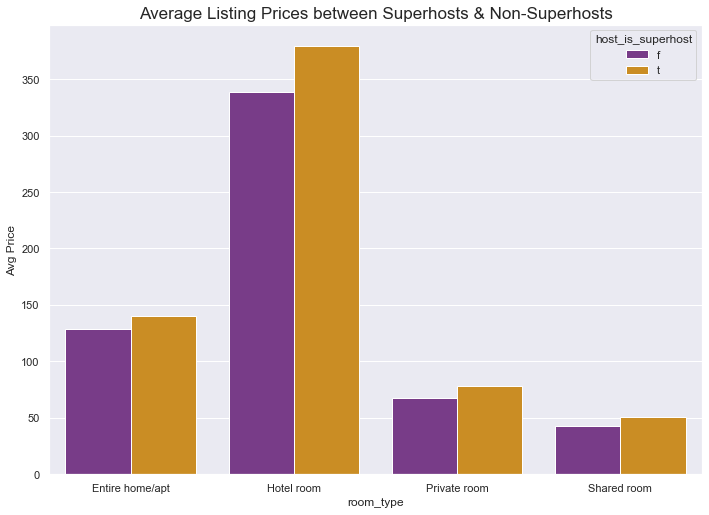

In [72]:
sns.barplot(data = superhost_price_df, 
            x = "room_type", 
            y = "Avg Price", 
            hue = "host_is_superhost", 
            palette = sns.color_palette('CMRmap', n_colors=2)).set_title("Average Listing Prices between Superhosts & Non-Superhosts", fontdict = {'size': 17})

Superhosts do tend to price their listings higher on the average, with the difference generally between $11 to $16 - pretty negligible depending on how tight one's budget is.

### Other Tangible Factors

Text(0.5, 1.0, 'Total No. of Amenities vs Price')

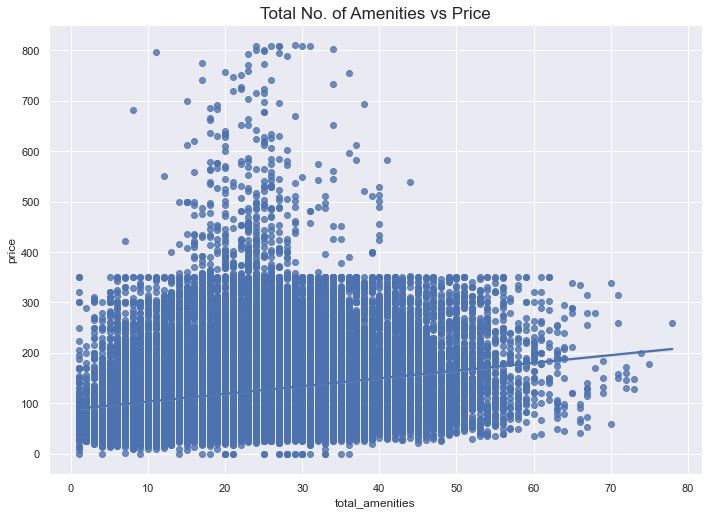

In [73]:
sns.regplot(data=paris_df, 
                x="total_amenities", 
                y="price").set_title("Total No. of Amenities vs Price", fontdict = {'size': 17})

In [74]:
print("Highest Number of Amenities:", paris_df.total_amenities.max())
print("Lowest Number of Amenities:", paris_df.total_amenities.min())
print("Correlation between number of amenities and price:", paris_df['total_amenities'].corr(paris_df['price']))
print("Weak positive correlation")

Highest Number of Amenities: 78
Lowest Number of Amenities: 1
Correlation between number of amenities and price: 0.2291301977872739
Weak positive correlation


Text(0.5, 1.0, 'No. of Accomodates vs Price')

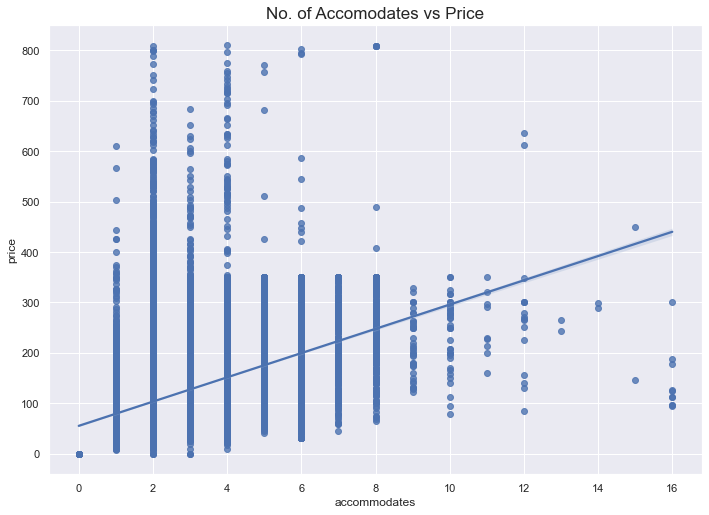

In [75]:
sns.regplot(data=paris_df, 
                x="accommodates", 
                y="price").set_title("No. of Accomodates vs Price", fontdict = {'size': 17})

In [76]:
print("Max Number of Accommodates:", paris_df.accommodates.max())
print("Min Number of Accommodates:", paris_df.accommodates.min(), "(Hotel Rooms)")
print("Correlation between number of accommodates and price:", paris_df['accommodates'].corr(paris_df['price']))
print("Moderate positive correlation")

Max Number of Accommodates: 16
Min Number of Accommodates: 0 (Hotel Rooms)
Correlation between number of accommodates and price: 0.4263486699385635
Moderate positive correlation


### Other Intangible Factors

In [77]:
response_rate_pivot = pd.pivot_table(paris_df,index=["host_response_time"],
                                              values=["availability_30", 
                                                      "availability_60",
                                                      "availability_90",],
               aggfunc={"availability_30":[np.mean],
                        "availability_60":[np.mean],
                        "availability_90":[np.mean]},fill_value=0)
response_rate_pivot = response_rate_pivot.unstack()
response_rate_df = response_rate_pivot.reset_index()
response_rate_df = response_rate_df.drop(['level_1'], axis = 1)       
response_rate_df.rename(columns={"level_0": "Availability", 0: "Mean"}, inplace = True)
response_rate_df

,Availability,host_response_time,Mean
0,availability_30,a few days or more,4.781643
1,availability_30,within a day,2.990906
2,availability_30,within a few hours,2.893524
3,availability_30,within an hour,3.800909
4,availability_60,a few days or more,13.892754
5,availability_60,within a day,9.807164
6,availability_60,within a few hours,9.754522
7,availability_60,within an hour,12.337635
8,availability_90,a few days or more,26.475362
9,availability_90,within a day,19.900334


Text(0.5, 1.0, 'Listing Availability vs Response Time Taken by Host')

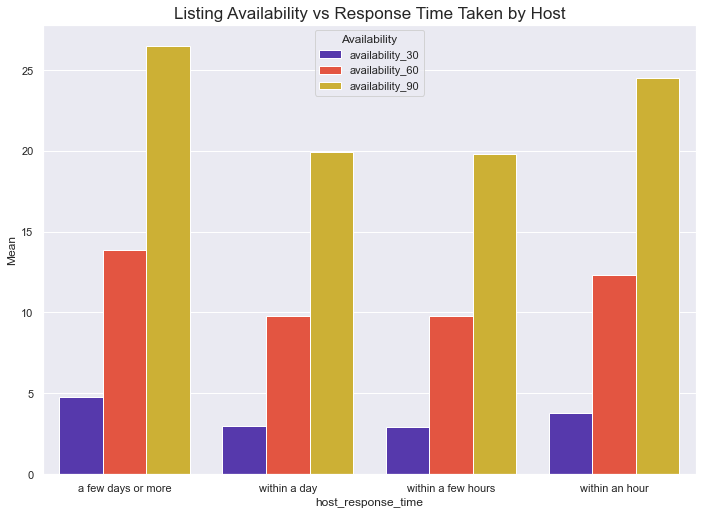

In [78]:
sns.barplot(data = response_rate_df, 
            x = "host_response_time", 
            y = "Mean", 
            hue = "Availability", 
            palette = sns.color_palette('CMRmap', n_colors=3)).set_title("Listing Availability vs Response Time Taken by Host", fontdict = {'size': 17})

A general guideline to keep responses within a day since there is negligible difference between that and responding within a few hours. It is surprising however to see a more substantial difference in availability between responding within an hour and a few days or more. We can infer that listings do not get booked as much when hosts take too long to respond as it gives potential tenants more time to source for other options. As for the other end of the spectrum, we can surmise that the fast response time could possibly be due to hosts with newer listings without much reviews or listings with not as good reviews trying to secure bookings as soon as possible - the actual reason can only be confirmed when the affected listings are drilled into.

Text(0.5, 1.0, 'Review Scores vs Price')

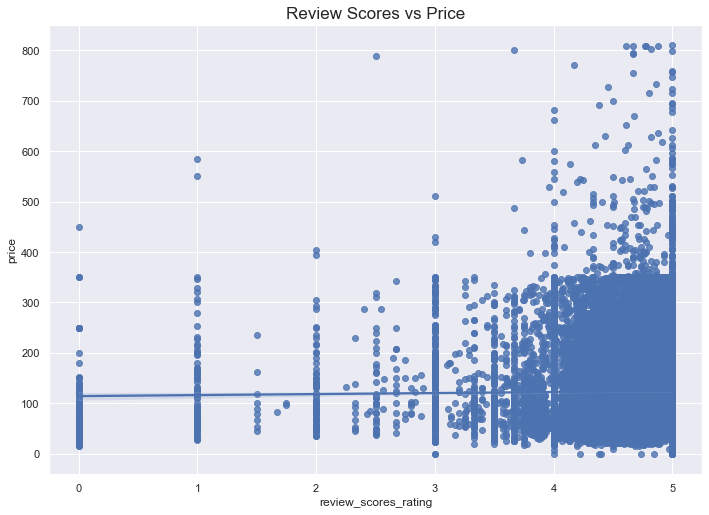

In [79]:
sns.regplot(data=paris_df, 
                x="review_scores_rating", 
                y="price").set_title("Review Scores vs Price", fontdict = {'size': 17})

In [80]:
print("Correlation between review scores and price:", paris_df['review_scores_rating'].corr(paris_df['price']))
print("Very weak positive correlation")

Correlation between review scores and price: 0.013523029337222455
Very weak positive correlation


In [81]:
#Finding the 25th, 50th, 75th and 100th percentile for sorting after
sorted(paris_df)
q1, q2, q3, q4 = np.nanpercentile(paris_df[['review_scores_rating']],[25,50,75,100])
print('25th Percentile =', q1)
print('50th Percentile =', q2)
print('75th Percentile =', q3)
print('100th Percentile =', q4)
print("Max Review Score Rating:", paris_df.review_scores_rating.max())
print("Min Review Score Rating:", paris_df.review_scores_rating.min())
print("Median Review Score Rating", paris_df.review_scores_rating.median())
print("Average Review Score Rating", paris_df.review_scores_rating.mean())

25th Percentile = 4.56
50th Percentile = 4.8
75th Percentile = 4.97
100th Percentile = 5.0
Max Review Score Rating: 5.0
Min Review Score Rating: 0.0
Median Review Score Rating 4.8
Average Review Score Rating 4.664964275122099


In [82]:
rating_df = paris_df[['name', 'availability_30', 'availability_60', 'availability_90', 'review_scores_rating']]
rating_df.head()

,name,availability_30,availability_60,availability_90,review_scores_rating
0,Charming Apartment 2BR in Paris 9e,4,26,38,4.60
1,Charming at Montmartre & rue Lepic- mobility l...,0,0,0,4.72
2,Explore the heart of old Paris,4,20,50,4.53
3,MARAIS - 2ROOMS APT - 2/4 PEOPLE,0,13,22,4.71
4,Lovely place near Champs Elysees,2,14,44,4.48


In [83]:
def percentile_sort(rating_df):
    
    if (rating_df['review_scores_rating'] <= 4.56):
        return 25
    elif 4.57 <= rating_df['review_scores_rating'] <= 4.80:
        return 50
    elif 4.81 <= rating_df['review_scores_rating'] <= 4.97:
        return 75
    elif 4.98 <= rating_df['review_scores_rating'] <= 5.0:
        return 100

In [84]:
rating_df['review_scores_percentile'] = rating_df.apply(percentile_sort, axis = 1)
rating_df

/var/folders/l4/snqmxyzx0fdd92ms959qvmdh0000gn/T/ipykernel_3484/3476377674.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rating_df['review_scores_percentile'] = rating_df.apply(percentile_sort, axis = 1)


,name,availability_30,availability_60,availability_90,review_scores_rating,review_scores_percentile
0,Charming Apartment 2BR in Paris 9e,4,26,38,4.60,50.0
1,Charming at Montmartre & rue Lepic- mobility l...,0,0,0,4.72,50.0
2,Explore the heart of old Paris,4,20,50,4.53,25.0
3,MARAIS - 2ROOMS APT - 2/4 PEOPLE,0,13,22,4.71,50.0
4,Lovely place near Champs Elysees,2,14,44,4.48,25.0
...,...,...,...,...,...,...
42952,Family apartment near Paris,18,48,78,4.75,50.0
42953,Single bed studio near Paris,13,40,70,4.86,75.0
42954,Hotel room 5 min from Paris Porte de Versailles,6,23,40,4.77,50.0
42955,Superior Single bed studio near Paris,22,52,82,4.62,50.0


In [85]:
percentile_listing_counts = [rating_df["review_scores_percentile"].value_counts()]
percentile_listing_counts

[50.0     9796
 25.0     9344
 100.0    9120
 75.0     8829
 Name: review_scores_percentile, dtype: int64]

In [86]:
rating_pivot = pd.pivot_table(rating_df,index=["review_scores_percentile"],
                                              values=["availability_30", 
                                                      "availability_60",
                                                      "availability_90",],
               aggfunc={"availability_30":[np.mean],
                        "availability_60":[np.mean],
                        "availability_90":[np.mean]},fill_value=0)
rating_percentile_df = rating_pivot.reset_index()
rating_percentile_df = rating_percentile_df.droplevel(1, 1)
rating_percentile_df

,review_scores_percentile,availability_30,availability_60,availability_90
0,25.0,4.074058,12.485980,23.974636
1,50.0,2.574316,8.521437,17.420376
2,75.0,1.832144,6.277268,13.494280
3,100.0,2.350329,7.781360,15.426754


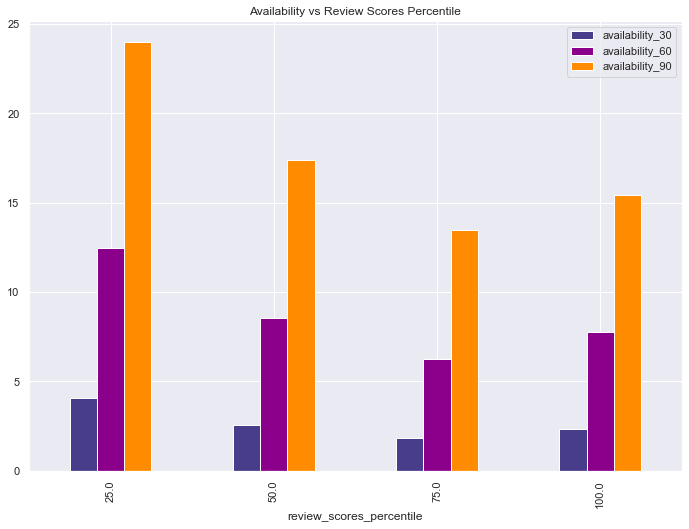

In [88]:
whee = ['darkslateblue', 'darkmagenta', 'darkorange']
sns.set(font_scale=1)
review_percentile = rating_percentile_df.plot(
                    kind = 'bar',
                    x = "review_scores_percentile", 
                    y = ["availability_30", "availability_60", "availability_90"],
                    color = whee,
                    title = 'Availability vs Review Scores Percentile')

Generally the lower the overall rating of the listing the higher the availability. Lowest availability however is at the 75th percentile rather than 100th - possible reasons to attribute this to: more convenient locations, more affordable pricing, more reviews received which might have diluted the overall score as well.

## Conclusion

Having a superhost status increases the number of bookings 

There is sufficient evidence to support the claim that higher review scores result in more booking, albeit more at the 75th percentile than 100th percentile

Results reveal that location is a determining factor when it comes to pricing, especially for listings in Paris Centre (first to fourth arrondissements) where price is the highest

There is insufficient evidence to support the claim that pricing affects a listing’s availability

## Recommendations

<b><u>Hosts</u></b>

A good understanding of the nature of the arrondissement (touristy or commercial dominant) will help better identify the target audience to provide more suitable amenities and offerings

Knowing the average prices for the respective types of listings in the arrondissements will help in coming up with more competitive prices to attract more potential travellers to make reservations

Non-superhosts should consider upgrading their statuses as it can help to boost their listings

<b><u>Travellers</u></b>

Likewise for travellers, a good understanding of the nature of the arrondissement will enable them to plan their routes better and select an area and room type that caters more to their needs (e.g. touristy vs hippy, bohemian vibes)

Location is a determining factor when it comes to pricing, hence a good understanding of the nature of the arrondissement will also help travellers to find a listing that suits their budget
